# imports

In [169]:
import numpy as np
import scanpy as sc
import pandas as pd
import anndata as ad
import seaborn as sns
import matplotlib.pyplot as plt

from scipy.spatial.distance import *

sc.settings.set_figure_params(dpi=80)


# slideseq

## slideseq data loading

In [3]:
slideseq_root = '/home/yzy/PUBDT/st/slideseq/'
slideseq_name = 'Puck_180413_7'

# read count
# g个基因，n个细胞，每一行是一个基因，前两列是ENSEMBL／gene；其后是按顺序的细胞
gene_list = []
ENSEMBL_list = []
cell_list = []
count_list = []
slideseq_count_file = slideseq_root+slideseq_name+'.count'
with open(slideseq_count_file,'r') as f:
    i=0
    for line in f:
        line = str.strip(line)
        line_sp = line.split(',')
        if i==0:
            cell_list = line_sp[2:]
        else:
            ENSEMBL_list.append(line_sp[0])
            gene_list.append(line_sp[1])
            count_list.append(line_sp[2:])
        i+=1
# g*n
count_mat = np.array(count_list).astype('int')


cellid_list=[]
index_list=[]
x_list=[]
y_list=[]
slideseq_index_file = slideseq_root+slideseq_name+'.idx'
with open(slideseq_index_file) as f:
    i=0
    for line in f:
        line = str.strip(line)
        line_sp = line.split(',')
        if i==0:
            i+=1
            continue
        else:
            cellid_list.append(line_sp[0])
            index_list.append(line_sp[1])
            x_list.append(line_sp[2])
            y_list.append(line_sp[3])
        i+=1
x_list = np.array(x_list).astype('float32')
y_list = np.array(y_list).astype('float32')
            

In [5]:
len(cellid_list)

12282

In [10]:
in_X = np.transpose(count_mat)
obs_name = cellid_list
# g = map(str,range(in_X.shape[1]))
g = gene_list

obs = pd.DataFrame(index=obs_name)

# var_name must be str
var = pd.DataFrame(index=g)
# obs['barcode'] = np.array(index_list)
var['ENSEMBL'] = np.array(ENSEMBL_list)
# obs['true_labels'] = np.array(tenx_73k_label)
# obs['true_labels'] = obs['true_labels'].astype('category')
#     var['Genes'] = Genes
adata = ad.AnnData(in_X,  obs=obs,var=var, dtype='float32')
adata.obsm['spatial'] = np.concatenate((x_list.reshape(-1,1),y_list.reshape(-1,1)),axis=1)
adata.obs['spatial_x'] = x_list
adata.obs['spatial_y'] = y_list

In [12]:
adata.X

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.]], dtype=float32)

In [40]:
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

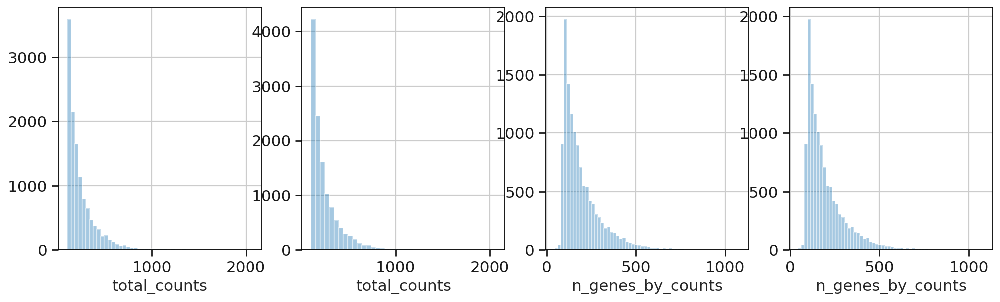

In [43]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.distplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.distplot(adata.obs["total_counts"][adata.obs["total_counts"] < 10000], kde=False, bins=40, ax=axs[1])
sns.distplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.distplot(adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 4000], kde=False, bins=60, ax=axs[3])

In [46]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=500)

In [48]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")

/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/envs/scaden/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/e

## slideseq ploting

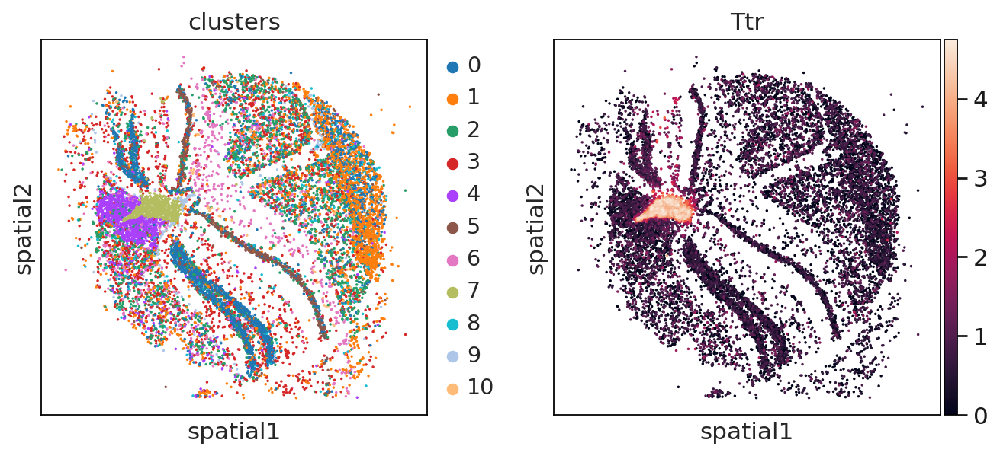

In [49]:
sc.pl.embedding(adata,basis='spatial',color=['clusters','Ttr'])

## distance analysis

In [51]:
adata.obsm['X_pca']

(12282, 50)

In [52]:
gene_use = 'Ttr'
spatial_mat = adata.obsm['spatial']
# exp_mat = np.array(adata[:,gene_use].X)
exp_mat = np.array(adata.obsm['X_pca'])
spatial_distmat = squareform(pdist(spatial_mat))
exp_distmat = squareform(pdist(exp_mat))




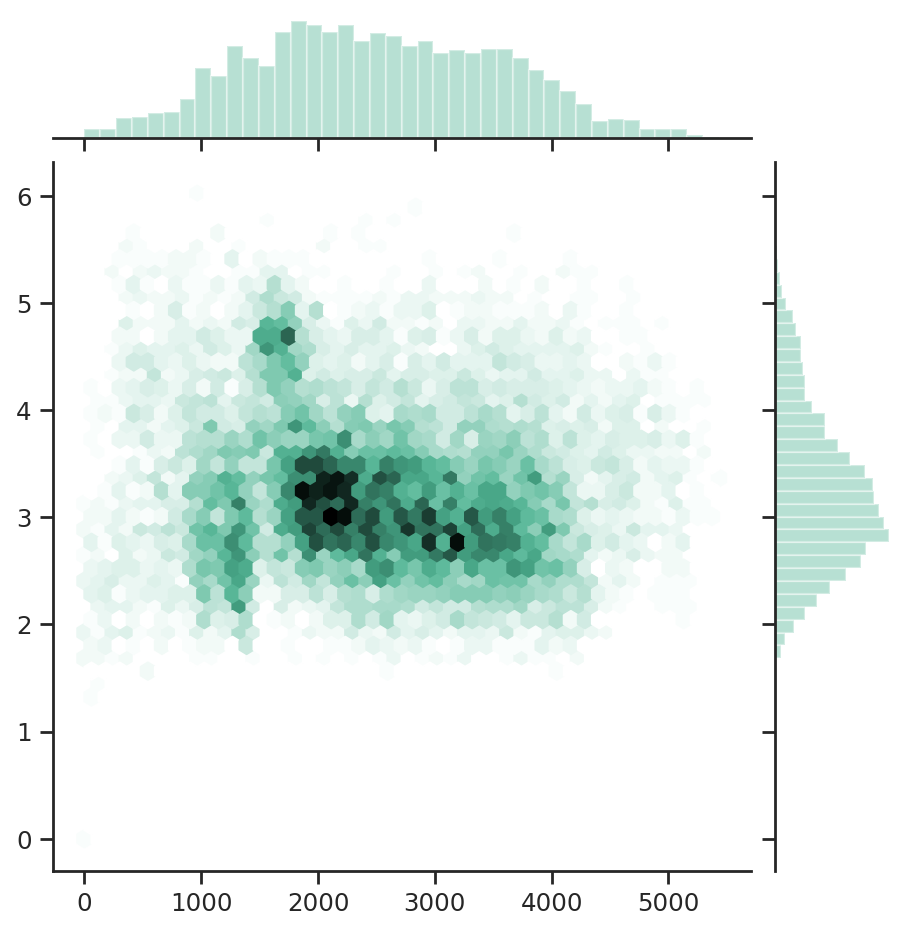

In [53]:
sns.set(style="ticks")


sns.jointplot(spatial_distmat[0,:], exp_distmat[0,:], kind="hex", color="#4CB391")

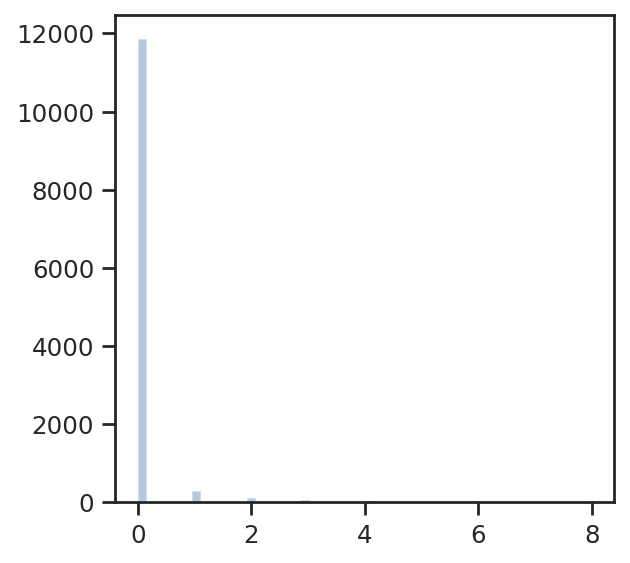

In [35]:
sns.distplot(exp_distmat[0,:],kde=False)

# slideseq: Puck_180528_23

In [54]:
slideseq_root = '/home/yzy/PUBDT/st/slideseq/'
slideseq_name = 'Puck_180528_23'

# read count
# g个基因，n个细胞，每一行是一个基因，前两列是ENSEMBL／gene；其后是按顺序的细胞
gene_list = []
ENSEMBL_list = []
cell_list = []
count_list = []
slideseq_count_file = slideseq_root+slideseq_name+'.count'
with open(slideseq_count_file,'r') as f:
    i=0
    for line in f:
        line = str.strip(line)
        line_sp = line.split(',')
        if i==0:
            cell_list = line_sp[2:]
        else:
            ENSEMBL_list.append(line_sp[0])
            gene_list.append(line_sp[1])
            count_list.append(line_sp[2:])
        i+=1
# g*n
count_mat = np.array(count_list).astype('int')


cellid_list=[]
index_list=[]
x_list=[]
y_list=[]
slideseq_index_file = slideseq_root+slideseq_name+'.idx'
with open(slideseq_index_file) as f:
    i=0
    for line in f:
        line = str.strip(line)
        line_sp = line.split(',')
        if i==0:
            i+=1
            continue
        else:
            cellid_list.append(line_sp[0])
            index_list.append(line_sp[1])
            x_list.append(line_sp[2])
            y_list.append(line_sp[3])
        i+=1
x_list = np.array(x_list).astype('float32')
y_list = np.array(y_list).astype('float32')
            

In [55]:
in_X = np.transpose(count_mat)
obs_name = cellid_list
# g = map(str,range(in_X.shape[1]))
g = gene_list

obs = pd.DataFrame(index=obs_name)

# var_name must be str
var = pd.DataFrame(index=g)
# obs['barcode'] = np.array(index_list)
var['ENSEMBL'] = np.array(ENSEMBL_list)
# obs['true_labels'] = np.array(tenx_73k_label)
# obs['true_labels'] = obs['true_labels'].astype('category')
#     var['Genes'] = Genes
adata = ad.AnnData(in_X,  obs=obs,var=var, dtype='float32')
adata.obsm['spatial'] = np.concatenate((x_list.reshape(-1,1),y_list.reshape(-1,1)),axis=1)
adata.obs['spatial_x'] = x_list
adata.obs['spatial_y'] = y_list

In [56]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=500)

In [57]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")

/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/envs/scaden/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


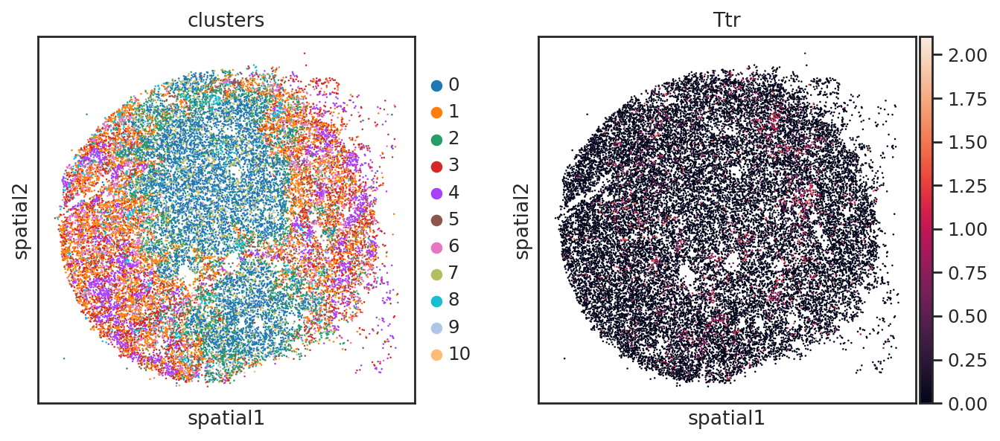

In [58]:
sc.pl.embedding(adata,basis='spatial',color=['clusters','Ttr'])

In [59]:
gene_use = 'Ttr'
spatial_mat = adata.obsm['spatial']
# exp_mat = np.array(adata[:,gene_use].X)
exp_mat = np.array(adata.obsm['X_pca'])
spatial_distmat = squareform(pdist(spatial_mat))
exp_distmat = squareform(pdist(exp_mat))




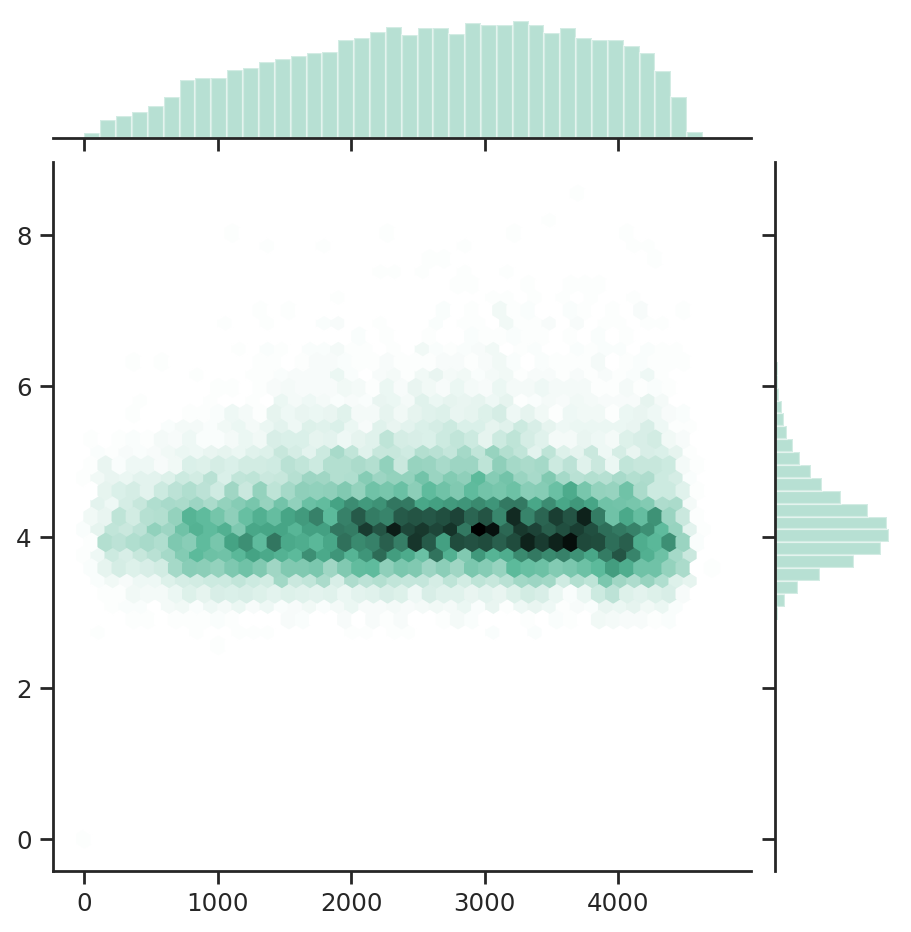

In [63]:
sns.jointplot(spatial_distmat[0,:], exp_distmat[0,:], kind="hex", color="#4CB391")
plt.savefig('figures/grid_plot1.png',transparent=False,format='png',
            bbox_inches='tight', pad_inches=0,dpi=500)


# slideseq: Puck_180803_8

/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/envs/scaden/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Ple

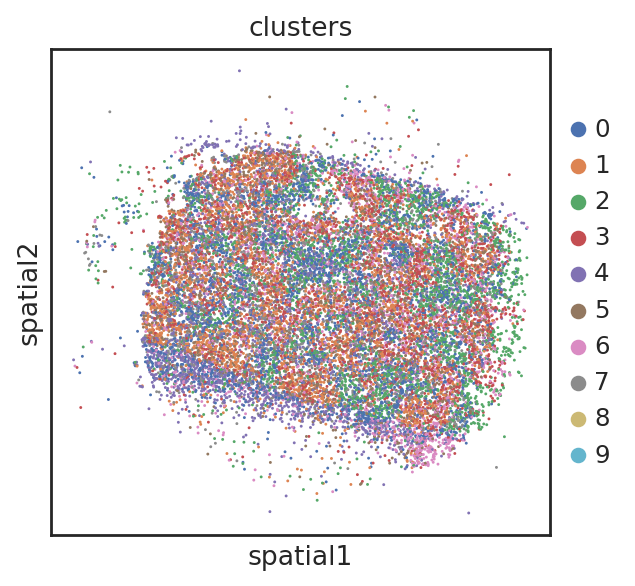

In [66]:
slideseq_root = '/home/yzy/PUBDT/st/slideseq/'
slideseq_name = 'Puck_180803_8'

# read count
# g个基因，n个细胞，每一行是一个基因，前两列是ENSEMBL／gene；其后是按顺序的细胞
gene_list = []
ENSEMBL_list = []
cell_list = []
count_list = []
slideseq_count_file = slideseq_root+slideseq_name+'.count'
with open(slideseq_count_file,'r') as f:
    i=0
    for line in f:
        line = str.strip(line)
        line_sp = line.split(',')
        if i==0:
            cell_list = line_sp[2:]
        else:
            ENSEMBL_list.append(line_sp[0])
            gene_list.append(line_sp[1])
            count_list.append(line_sp[2:])
        i+=1
# g*n
count_mat = np.array(count_list).astype('int')


cellid_list=[]
index_list=[]
x_list=[]
y_list=[]
slideseq_index_file = slideseq_root+slideseq_name+'.idx'
with open(slideseq_index_file) as f:
    i=0
    for line in f:
        line = str.strip(line)
        line_sp = line.split(',')
        if i==0:
            i+=1
            continue
        else:
            cellid_list.append(line_sp[0])
            index_list.append(line_sp[1])
            x_list.append(line_sp[2])
            y_list.append(line_sp[3])
        i+=1
x_list = np.array(x_list).astype('float32')
y_list = np.array(y_list).astype('float32')
            
    
    
in_X = np.transpose(count_mat)
obs_name = cellid_list
# g = map(str,range(in_X.shape[1]))
g = gene_list

obs = pd.DataFrame(index=obs_name)

# var_name must be str
var = pd.DataFrame(index=g)
# obs['barcode'] = np.array(index_list)
var['ENSEMBL'] = np.array(ENSEMBL_list)
# obs['true_labels'] = np.array(tenx_73k_label)
# obs['true_labels'] = obs['true_labels'].astype('category')
#     var['Genes'] = Genes
adata = ad.AnnData(in_X,  obs=obs,var=var, dtype='float32')
adata.obsm['spatial'] = np.concatenate((x_list.reshape(-1,1),y_list.reshape(-1,1)),axis=1)
adata.obs['spatial_x'] = x_list
adata.obs['spatial_y'] = y_list




sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=500)



sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")

sc.pl.embedding(adata,basis='spatial',color=['clusters'])



gene_use = 'Ttr'
spatial_mat = adata.obsm['spatial']
# exp_mat = np.array(adata[:,gene_use].X)
exp_mat = np.array(adata.obsm['X_pca'])
spatial_distmat = squareform(pdist(spatial_mat))
exp_distmat = squareform(pdist(exp_mat))




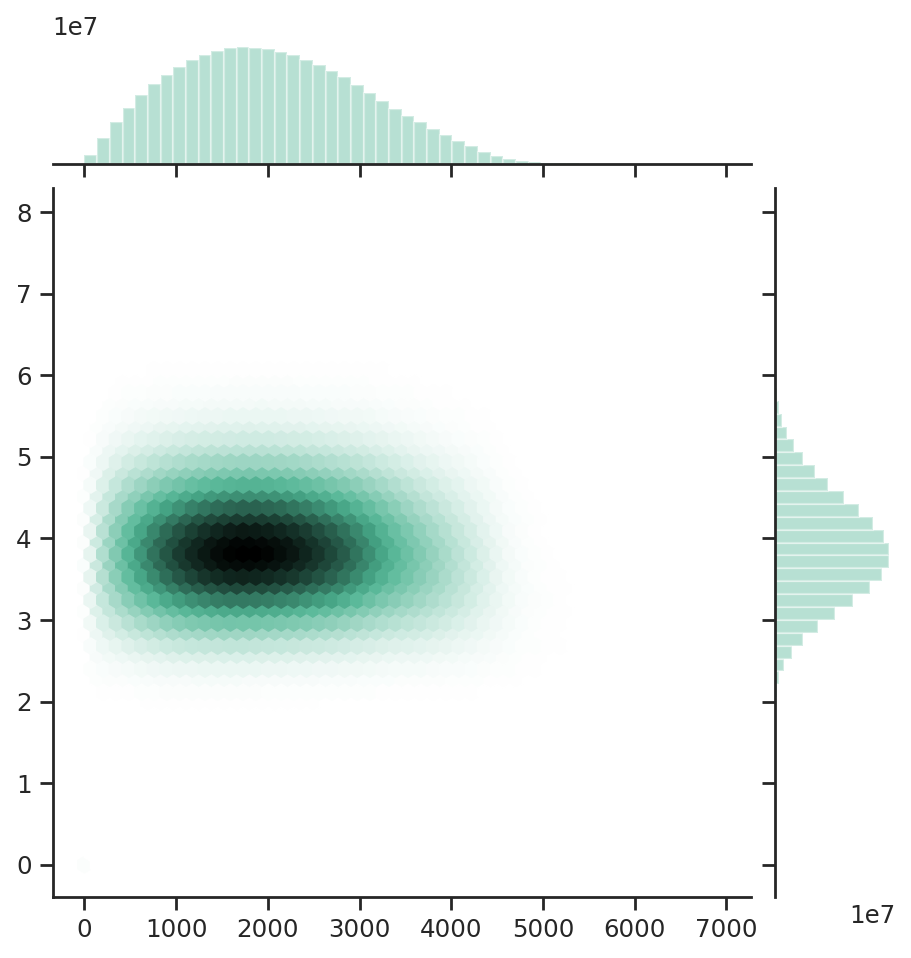

In [67]:
sns.jointplot(spatial_distmat, exp_distmat, kind="hex", color="#4CB391")
# plt.savefig(cur_save_file,transparent=True,format=figformat,bbox_inches='tight', pad_inches=0)
plt.savefig('figures/grid_plot_Puck_180803_8.png',transparent=False,format='png',
            bbox_inches='tight', pad_inches=0,dpi=500)


# slideseq: Puck_180819_11

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

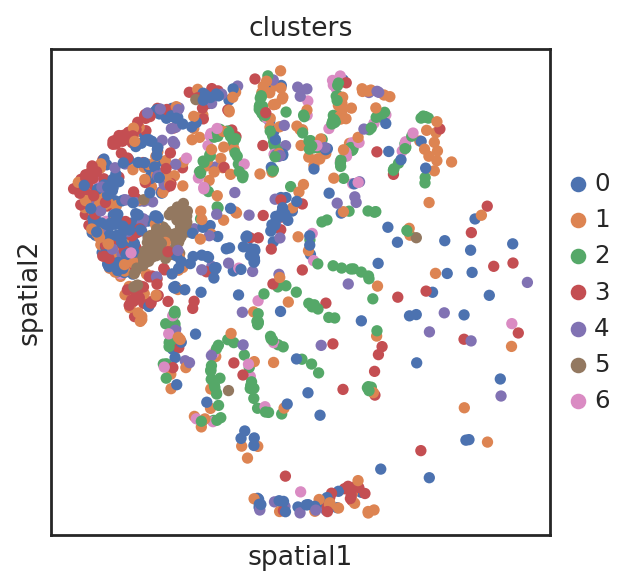

In [68]:
slideseq_root = '/home/yzy/PUBDT/st/slideseq/'
slideseq_name = 'Puck_180819_11'

# read count
# g个基因，n个细胞，每一行是一个基因，前两列是ENSEMBL／gene；其后是按顺序的细胞
gene_list = []
ENSEMBL_list = []
cell_list = []
count_list = []
slideseq_count_file = slideseq_root+slideseq_name+'.count'
with open(slideseq_count_file,'r') as f:
    i=0
    for line in f:
        line = str.strip(line)
        line_sp = line.split(',')
        if i==0:
            cell_list = line_sp[2:]
        else:
            ENSEMBL_list.append(line_sp[0])
            gene_list.append(line_sp[1])
            count_list.append(line_sp[2:])
        i+=1
# g*n
count_mat = np.array(count_list).astype('int')


cellid_list=[]
index_list=[]
x_list=[]
y_list=[]
slideseq_index_file = slideseq_root+slideseq_name+'.idx'
with open(slideseq_index_file) as f:
    i=0
    for line in f:
        line = str.strip(line)
        line_sp = line.split(',')
        if i==0:
            i+=1
            continue
        else:
            cellid_list.append(line_sp[0])
            index_list.append(line_sp[1])
            x_list.append(line_sp[2])
            y_list.append(line_sp[3])
        i+=1
x_list = np.array(x_list).astype('float32')
y_list = np.array(y_list).astype('float32')
            
    
    
in_X = np.transpose(count_mat)
obs_name = cellid_list
# g = map(str,range(in_X.shape[1]))
g = gene_list

obs = pd.DataFrame(index=obs_name)

# var_name must be str
var = pd.DataFrame(index=g)
# obs['barcode'] = np.array(index_list)
var['ENSEMBL'] = np.array(ENSEMBL_list)
# obs['true_labels'] = np.array(tenx_73k_label)
# obs['true_labels'] = obs['true_labels'].astype('category')
#     var['Genes'] = Genes
adata = ad.AnnData(in_X,  obs=obs,var=var, dtype='float32')
adata.obsm['spatial'] = np.concatenate((x_list.reshape(-1,1),y_list.reshape(-1,1)),axis=1)
adata.obs['spatial_x'] = x_list
adata.obs['spatial_y'] = y_list




sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=500)



sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")

sc.pl.embedding(adata,basis='spatial',color=['clusters'])



gene_use = 'Ttr'
spatial_mat = adata.obsm['spatial']
# exp_mat = np.array(adata[:,gene_use].X)
exp_mat = np.array(adata.obsm['X_pca'])
spatial_distmat = squareform(pdist(spatial_mat))
exp_distmat = squareform(pdist(exp_mat))




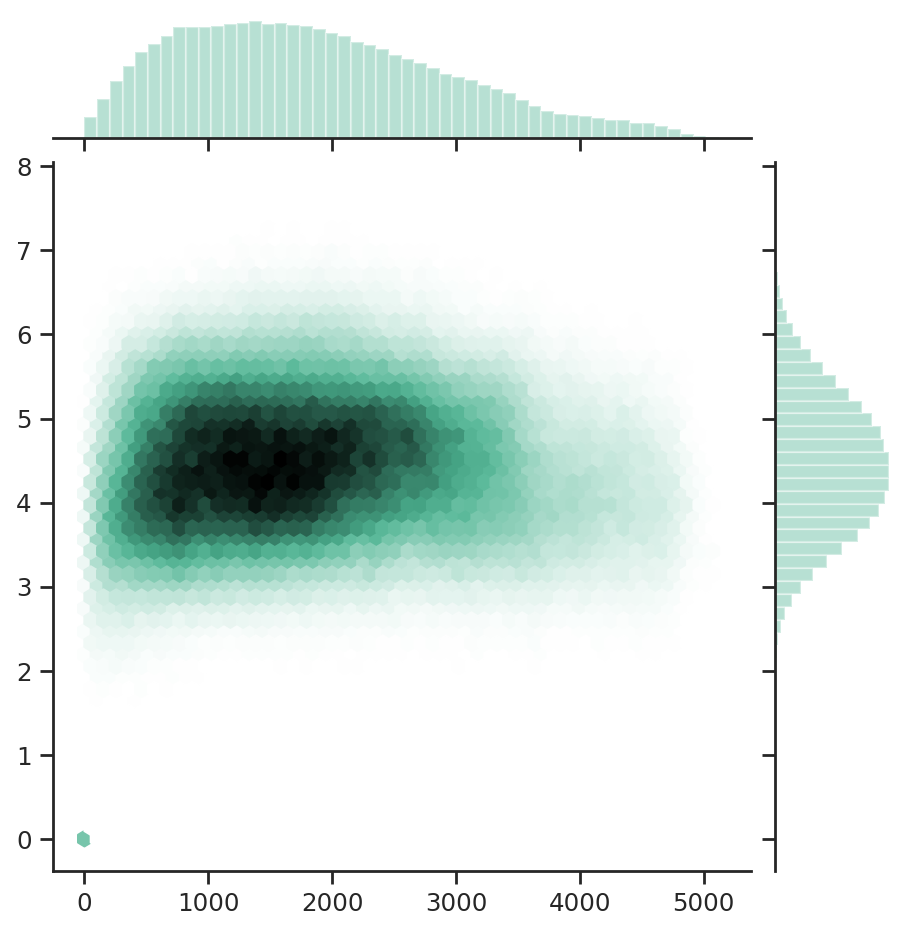

In [69]:
sns.jointplot(spatial_distmat, exp_distmat, kind="hex", color="#4CB391")
# plt.savefig(cur_save_file,transparent=True,format=figformat,bbox_inches='tight', pad_inches=0)
plt.savefig('figures/grid_plot_Puck_180819_11.png',transparent=False,format='png',
            bbox_inches='tight', pad_inches=0,dpi=500)


# slideseq:Puck_180819_19

/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/envs/scaden/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Ple

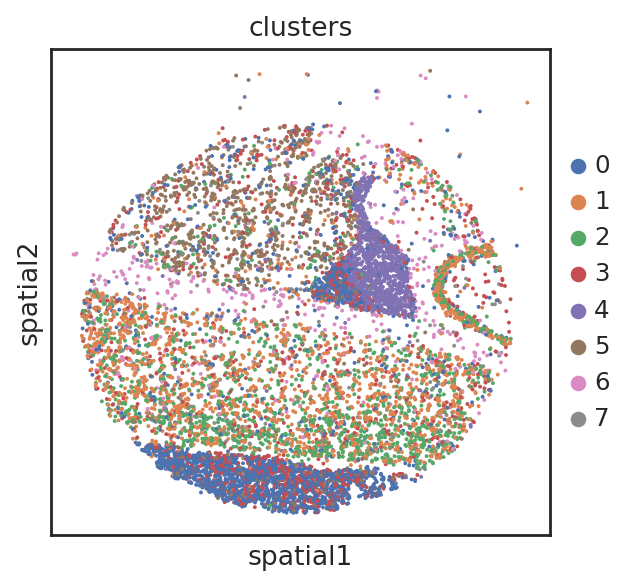

In [70]:
slideseq_root = '/home/yzy/PUBDT/st/slideseq/'
slideseq_name = 'Puck_180819_19'

# read count
# g个基因，n个细胞，每一行是一个基因，前两列是ENSEMBL／gene；其后是按顺序的细胞
gene_list = []
ENSEMBL_list = []
cell_list = []
count_list = []
slideseq_count_file = slideseq_root+slideseq_name+'.count'
with open(slideseq_count_file,'r') as f:
    i=0
    for line in f:
        line = str.strip(line)
        line_sp = line.split(',')
        if i==0:
            cell_list = line_sp[2:]
        else:
            ENSEMBL_list.append(line_sp[0])
            gene_list.append(line_sp[1])
            count_list.append(line_sp[2:])
        i+=1
# g*n
count_mat = np.array(count_list).astype('int')


cellid_list=[]
index_list=[]
x_list=[]
y_list=[]
slideseq_index_file = slideseq_root+slideseq_name+'.idx'
with open(slideseq_index_file) as f:
    i=0
    for line in f:
        line = str.strip(line)
        line_sp = line.split(',')
        if i==0:
            i+=1
            continue
        else:
            cellid_list.append(line_sp[0])
            index_list.append(line_sp[1])
            x_list.append(line_sp[2])
            y_list.append(line_sp[3])
        i+=1
x_list = np.array(x_list).astype('float32')
y_list = np.array(y_list).astype('float32')
            
    
    
in_X = np.transpose(count_mat)
obs_name = cellid_list
# g = map(str,range(in_X.shape[1]))
g = gene_list

obs = pd.DataFrame(index=obs_name)

# var_name must be str
var = pd.DataFrame(index=g)
# obs['barcode'] = np.array(index_list)
var['ENSEMBL'] = np.array(ENSEMBL_list)
# obs['true_labels'] = np.array(tenx_73k_label)
# obs['true_labels'] = obs['true_labels'].astype('category')
#     var['Genes'] = Genes
adata = ad.AnnData(in_X,  obs=obs,var=var, dtype='float32')
adata.obsm['spatial'] = np.concatenate((x_list.reshape(-1,1),y_list.reshape(-1,1)),axis=1)
adata.obs['spatial_x'] = x_list
adata.obs['spatial_y'] = y_list




sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=500)



sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")

sc.pl.embedding(adata,basis='spatial',color=['clusters'])



gene_use = 'Ttr'
spatial_mat = adata.obsm['spatial']
# exp_mat = np.array(adata[:,gene_use].X)
exp_mat = np.array(adata.obsm['X_pca'])
spatial_distmat = squareform(pdist(spatial_mat))
exp_distmat = squareform(pdist(exp_mat))




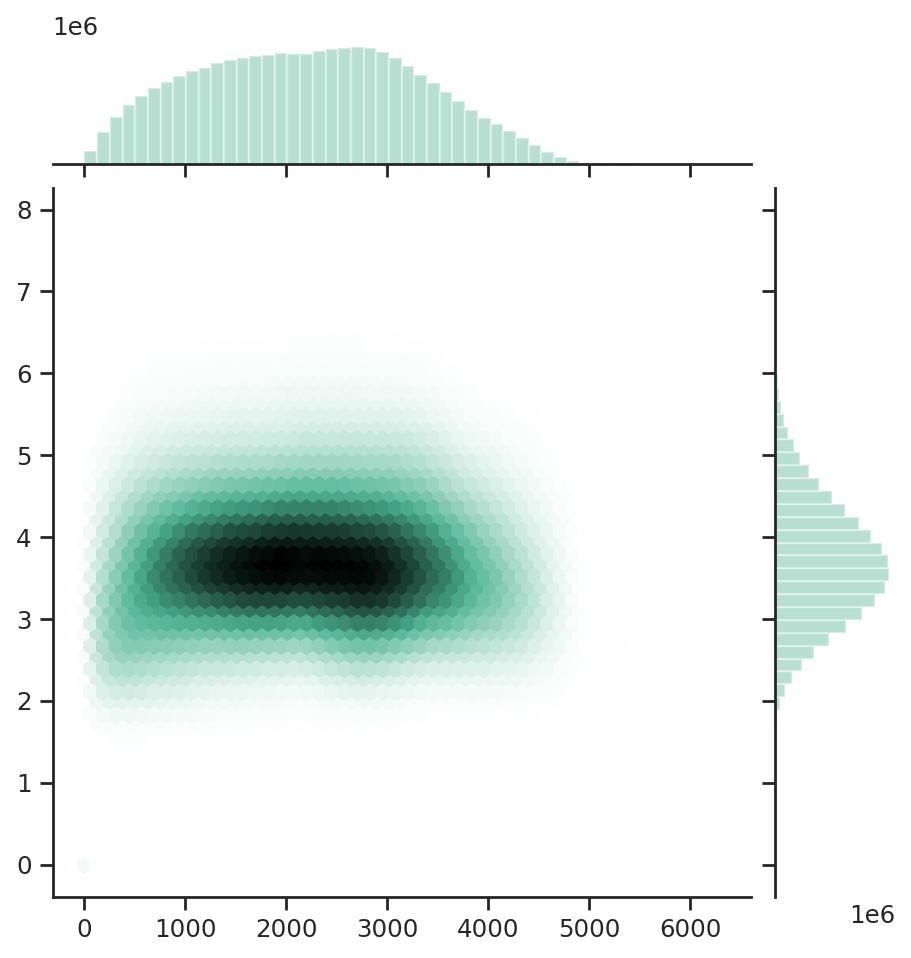

In [71]:
sns.jointplot(spatial_distmat, exp_distmat, kind="hex", color="#4CB391")
# plt.savefig(cur_save_file,transparent=True,format=figformat,bbox_inches='tight', pad_inches=0)
plt.savefig('figures/grid_plot_Puck_180819_19.png',transparent=False,format='png',
            bbox_inches='tight', pad_inches=0,dpi=500)


# slideseq: Puck_180413_7 coronal hippocampus

In [73]:
1+1

2

In [ ]:
slideseq_root = '/home/yzy/PUBDT/st/slideseq/all/'
slideseq_name = 'Puck_180413_7/Puck_180413_7'

# read count
# g个基因，n个细胞，每一行是一个基因，前两列是ENSEMBL／gene；其后是按顺序的细胞
gene_list = []
ENSEMBL_list = []
cell_list = []
count_list = []
slideseq_count_file = slideseq_root+slideseq_name+'.count'
with open(slideseq_count_file,'r') as f:
    i=0
    for line in f:
        line = str.strip(line)
        line_sp = line.split(',')
        if i==0:
            cell_list = line_sp[1:]
        else:
#             ENSEMBL_list.append(line_sp[0])
            gene_list.append(line_sp[0])
            count_list.append(line_sp[1:])
        i+=1
# g*n
count_mat = np.array(count_list).astype('int')


cellid_list=[]
index_list=[]
x_list=[]
y_list=[]
slideseq_index_file = slideseq_root+slideseq_name+'.idx'
with open(slideseq_index_file) as f:
    i=0
    for line in f:
        line = str.strip(line)
        line_sp = line.split(',')
        if i==0:
            i+=1
            continue
        else:
            cellid_list.append(line_sp[0])
#             index_list.append(line_sp[1])
            x_list.append(line_sp[1])
            y_list.append(line_sp[2])
        i+=1
x_list = np.array(x_list).astype('float32')
y_list = np.array(y_list).astype('float32')
            
    
    
in_X = np.transpose(count_mat)
obs_name = cellid_list
# g = map(str,range(in_X.shape[1]))
g = gene_list

obs = pd.DataFrame(index=obs_name)

# var_name must be str
var = pd.DataFrame(index=g)
# obs['barcode'] = np.array(index_list)
# var['ENSEMBL'] = np.array(ENSEMBL_list)
# obs['true_labels'] = np.array(tenx_73k_label)
# obs['true_labels'] = obs['true_labels'].astype('category')
#     var['Genes'] = Genes
adata = ad.AnnData(in_X,  obs=obs,var=var, dtype='float32')
adata.obsm['spatial'] = np.concatenate((x_list.reshape(-1,1),y_list.reshape(-1,1)),axis=1)
adata.obs['spatial_x'] = x_list
adata.obs['spatial_y'] = y_list






In [36]:
slideseq_root = '/home/yzy/PUBDT/st/slideseq/all/Puck_180413_7/'
slideseq_name = 'Puck_180413_7'
adata = sc.read_csv(slideseq_root+slideseq_name+'.count').transpose()
adata_idx = sc.read_csv(slideseq_root+slideseq_name+'.idx')
adata.obsm['spatial'] = adata_idx.X

In [37]:
adata_tmp = adata.copy()

In [38]:
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=3)

In [ ]:
adata.var["mt"] = adata.var_names.str.startswith("mt-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

In [ ]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [ ]:
adata = adata[adata.obs.n_genes_by_counts < 1000, :]
adata = adata[adata.obs.pct_counts_mt < 10, :]

In [48]:
# sc.pp.normalize_total(adata, inplace=True)
# sc.pp.log1p(adata)
# sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=1000)
sc.pp.highly_variable_genes(adata, n_top_genes=1000)



sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")

# sc.pl.embedding(adata,basis='spatial',color=['clusters'])


/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/envs/scaden/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


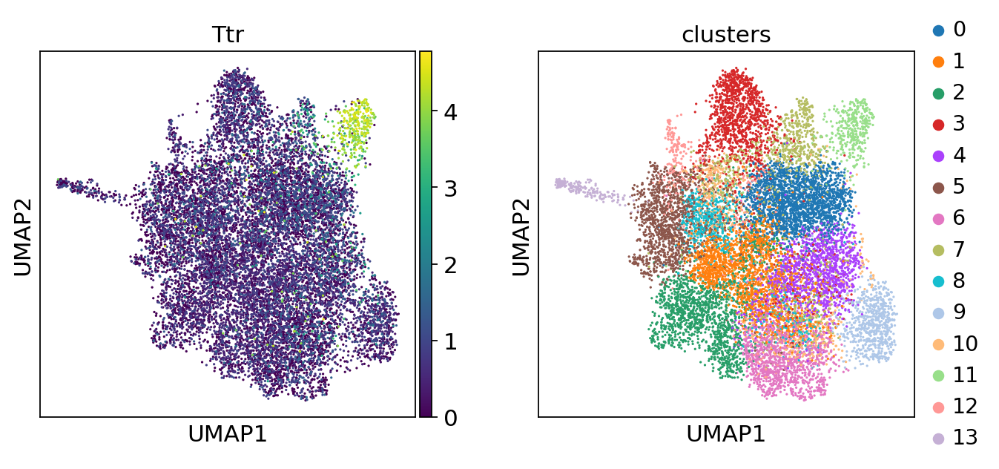

In [49]:
sc.pl.umap(adata,color=['Ttr','clusters'])

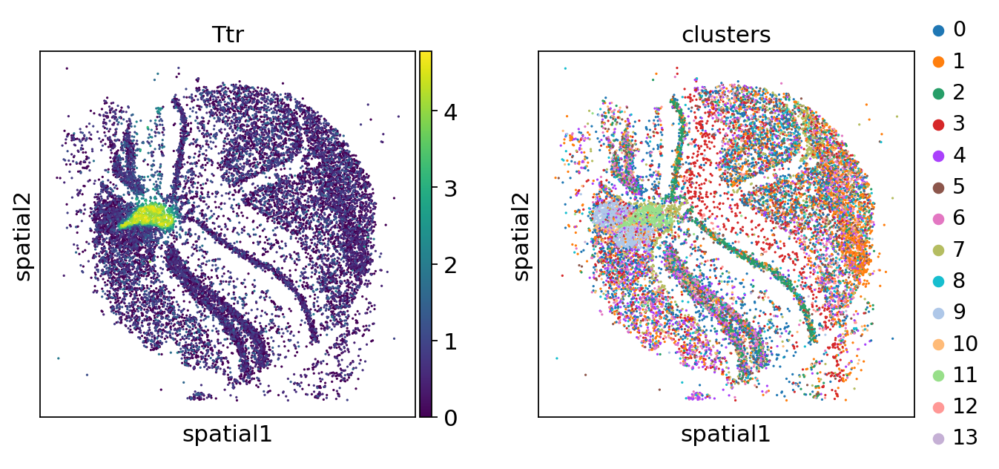

In [50]:
sc.pl.umap(adata,color=['Ttr','clusters'])
sc.pl.embedding(adata,basis='spatial',color=['Ttr','clusters'])


# slideseq: 180430_1 coronal cerebellum

In [51]:
del adata
del adata_tmp

In [52]:
slideseq_root = '/home/yzy/PUBDT/st/slideseq/all/Puck_180430_1/'
id_name = 'BeadLocationsForR.csv'
count_name = 'MappedDGEForR.csv'
adata = sc.read_csv(slideseq_root+count_name).transpose()
adata_idx = sc.read_csv(slideseq_root+id_name)
adata.obsm['spatial'] = adata_idx.X

In [53]:
adata_tmp = adata.copy()

In [77]:
del adata

In [78]:
adata = adata_tmp.copy()

In [69]:
adata.shape

(24847, 18906)

In [71]:
adata.var["mt"] = adata.var_names.str.startswith("mt-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

In [57]:
adata

AnnData object with n_obs × n_vars = 24847 × 18906 
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    obsm: 'spatial'

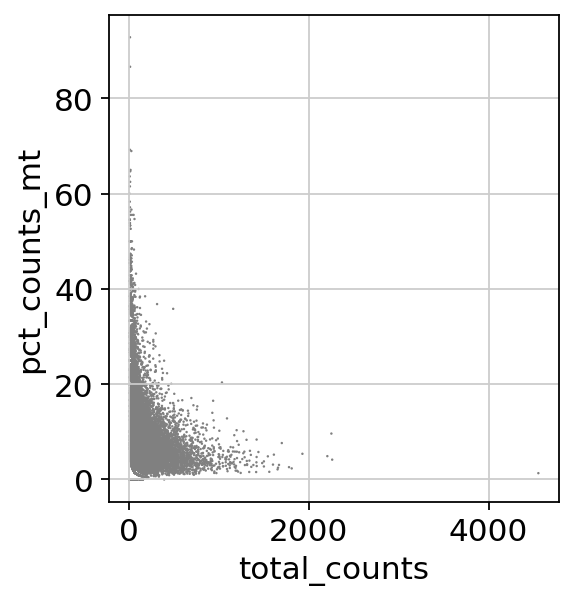

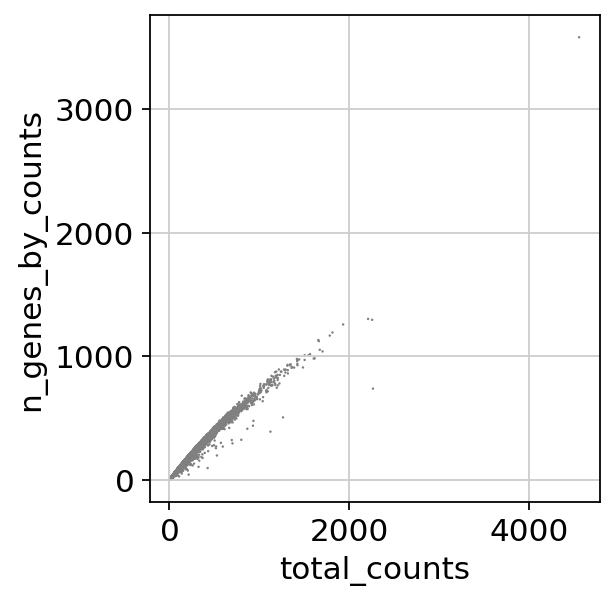

In [72]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [73]:
adata = adata[adata.obs.n_genes_by_counts < 1000, :]
adata = adata[adata.obs.pct_counts_mt < 10, :]

In [79]:
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=3)

In [80]:
adata

AnnData object with n_obs × n_vars = 9517 × 14693 
    obs: 'n_genes'
    var: 'n_cells'
    obsm: 'spatial'

In [81]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
# sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=1000)
sc.pp.highly_variable_genes(adata, n_top_genes=1000)



sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")

# sc.pl.embedding(adata,basis='spatial',color=['clusters'])


/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/envs/scaden/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


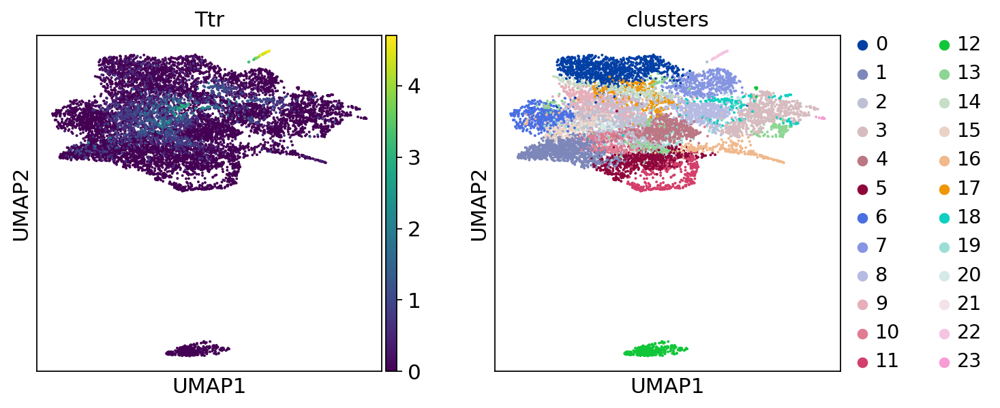

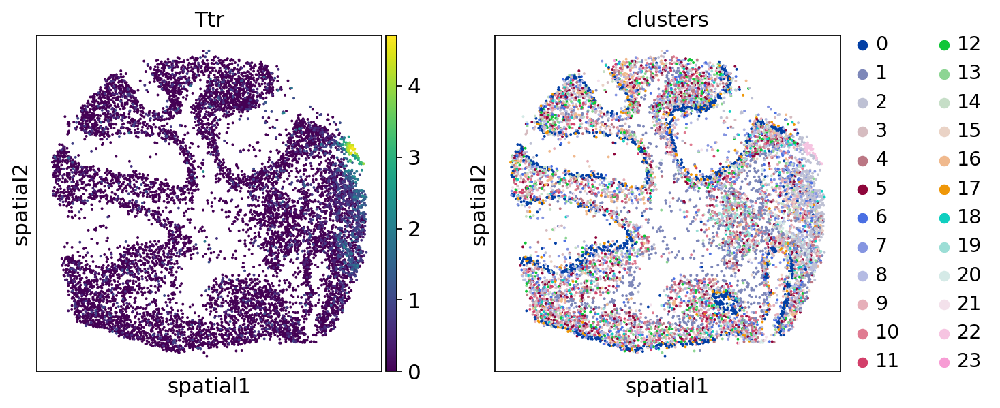

In [82]:
sc.pl.umap(adata,color=['Ttr','clusters'])
sc.pl.embedding(adata,basis='spatial',color=['Ttr','clusters'])


# 180819_3 F4A

In [83]:
del adata
del adata_tmp

In [117]:
slideseq_root = '/home/yzy/PUBDT/st/slideseq/all/Puck_180819_3/'
id_name = 'BeadLocationsForR.csv'
count_name = 'MappedDGEForR.csv'
adata = sc.read_csv(slideseq_root+count_name).transpose()
adata_idx = sc.read_csv(slideseq_root+id_name)
adata.obsm['spatial'] = adata_idx.X

In [118]:
adata_tmp = adata.copy()

In [91]:
adata = adata_tmp.copy()

In [86]:
adata.shape

(49283, 19777)

In [119]:
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=3)

In [120]:
adata.shape

(9221, 14654)

In [121]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
# sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=1000)
sc.pp.highly_variable_genes(adata, n_top_genes=1000)



sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")

# sc.pl.embedding(adata,basis='spatial',color=['clusters'])


/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/envs/scaden/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


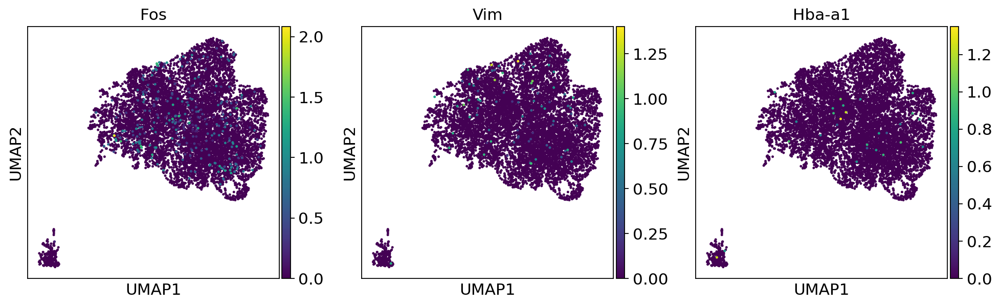

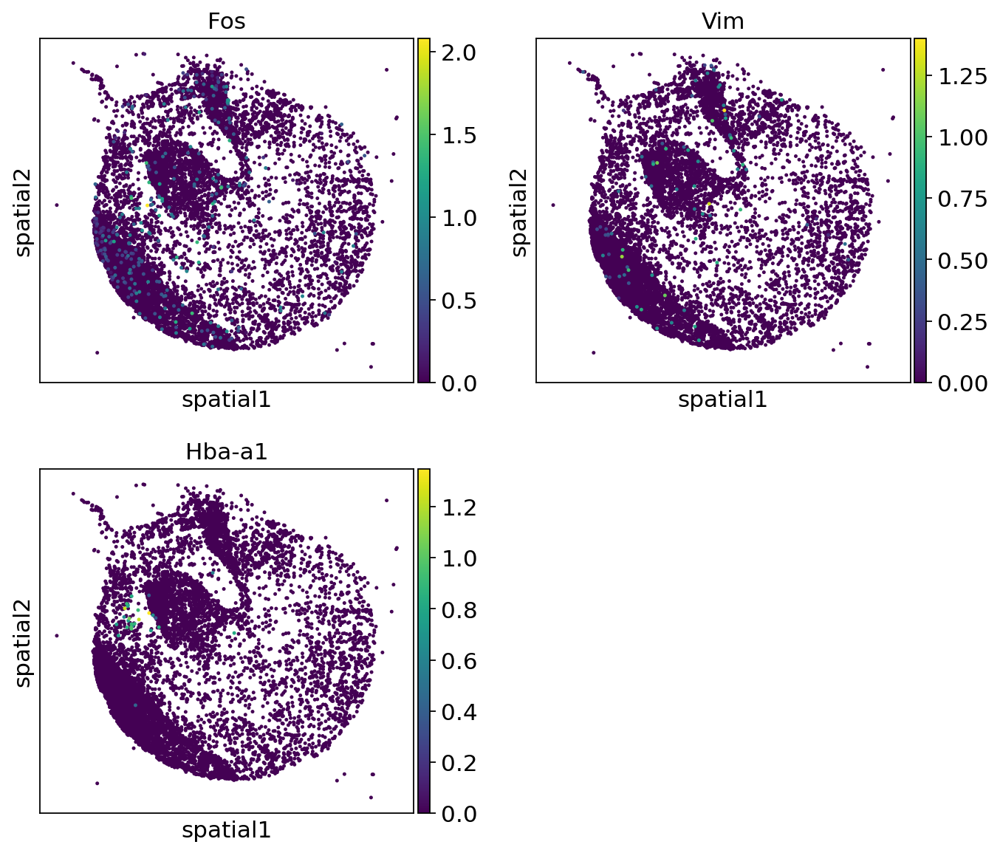

In [129]:
sc.pl.umap(adata,color=['Fos','Vim','Hba-a1'],s=20)
sc.pl.embedding(adata,basis='spatial',color=['Fos','Vim','Hba-a1'],s=20,ncols=2)


# 180819_6 F4C

In [97]:
slideseq_root = '/home/yzy/PUBDT/st/slideseq/all/Puck_180819_6/'
id_name = 'BeadLocationsForR.csv'
count_name = 'MappedDGEForR.csv'
adata = sc.read_csv(slideseq_root+count_name).transpose()
adata_idx = sc.read_csv(slideseq_root+id_name)
adata.obsm['spatial'] = adata_idx.X

In [98]:
adata_tmp = adata.copy()

In [109]:
adata = adata_tmp.copy()

In [115]:
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=3)

In [101]:
adata.shape

(10839, 14729)

In [102]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
# sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=1000)
sc.pp.highly_variable_genes(adata, n_top_genes=1000)



sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")

# sc.pl.embedding(adata,basis='spatial',color=['clusters'])


/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/envs/scaden/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


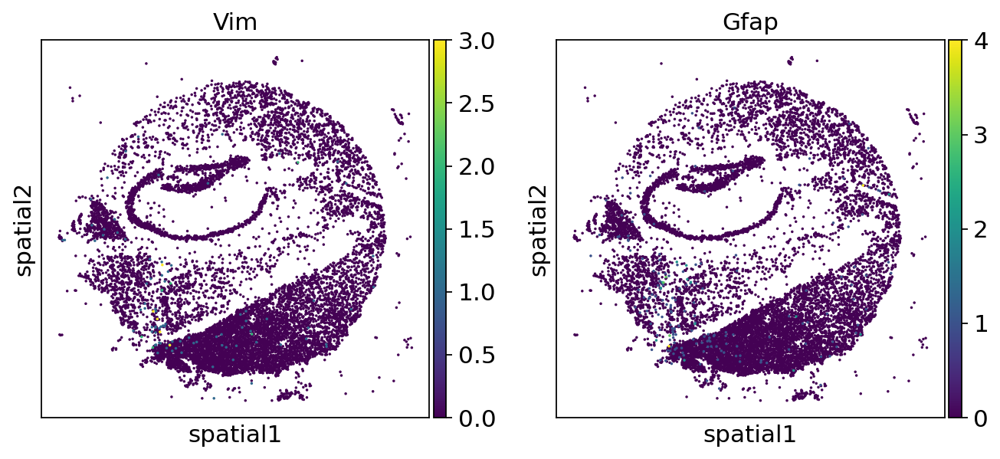

In [116]:
# sc.pl.umap(adata,color=['Vim','clusters'])
sc.pl.embedding(adata,basis='spatial',color=['Vim','Gfap'],s=10)


# liver

In [181]:
slideseq_root = '/home/yzy/PUBDT/st/slideseq/all/liver/'
cluster_file = 'cell_cluster_outcome.csv'
anno_file = 'cell_annotations.csv'
count_file = 'dge_hvgs.csv'

adata = sc.read_csv(slideseq_root+count_file)
adata_cluster = sc.read_csv(slideseq_root+cluster_file,dtype='str')
adata_anno = sc.read_csv(slideseq_root+anno_file,dtype='str')
# adata.obsm['spatial'] = adata_idx.X

In [143]:
np.array(adata_cluster[:,0].X).astype('int')

(460, 1)

In [182]:
adata.obs['cluster'] = np.array(adata_cluster[:,0].X).astype('int')
adata.obs['subcluster'] = np.array(adata_cluster[:,1].X).astype('int')
adata.obs['mouse'] = np.array(adata_anno[:,0].X).astype('str')
adata.obs['type'] = np.array(adata_anno[:,1].X).astype('str')
adata.obs['id'] = np.array(adata_anno[:,2].X).astype('int')

In [153]:
np.unique(adata.obs['type'])

array(['endothelial cell', 'hepatocyte'], dtype=object)

In [199]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
# sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=1000)
sc.pp.highly_variable_genes(adata, n_top_genes=5000)



sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata,resolution=0.5)

# sc.pl.embedding(adata,basis='spatial',color=['clusters'])


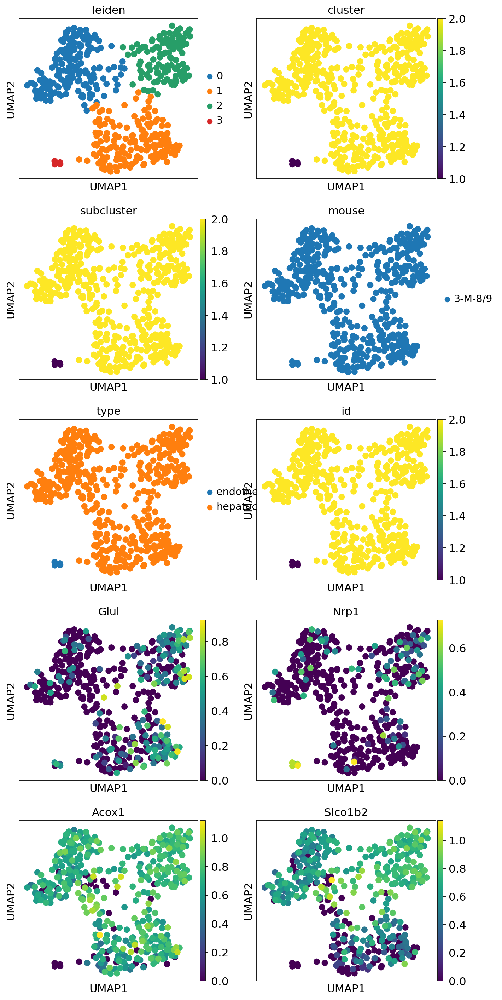

In [200]:
sc.pl.umap(adata,color=['leiden','cluster','subcluster','mouse','type',
                       'id','Glul','Nrp1','Acox1','Slco1b2'],ncols=2)

In [201]:
sc.tl.rank_genes_groups(adata,groupby='leiden')

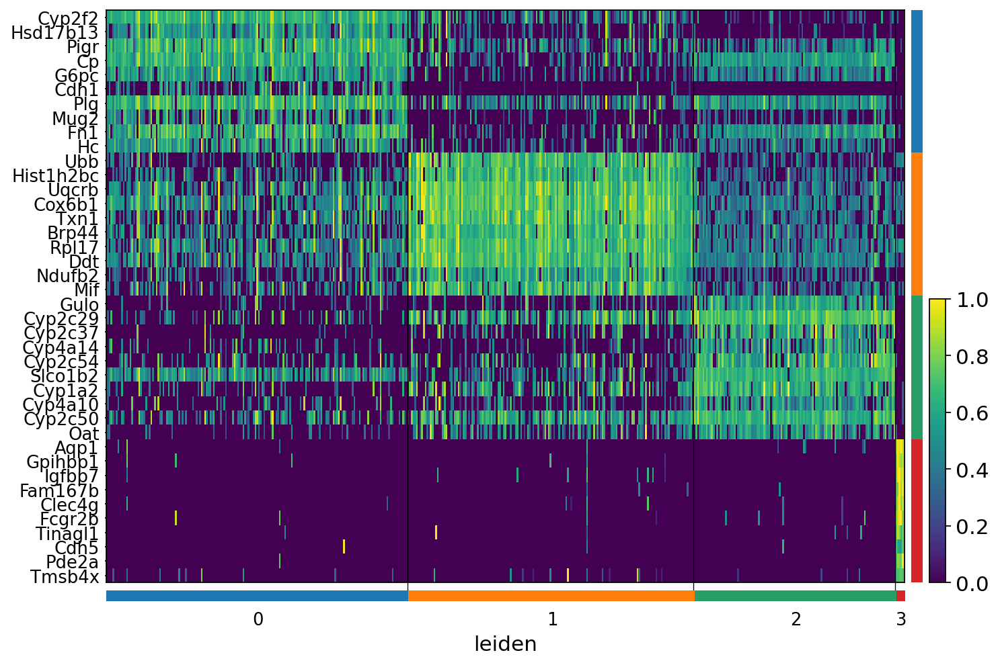

In [203]:
sc.pl.rank_genes_groups_heatmap(adata,standard_scale='var',
                                swap_axes=True,show_gene_labels=True,dendrogram=False)

# kidney

In [173]:
slideseq_root = '/home/yzy/PUBDT/st/slideseq/all/kidney/'
cluster_file = 'cell_cluster_outcome.csv'
cluster_file2 = 'cluster_outcomes.csv'
anno_file = 'cell_annotations.csv'
count_file = 'dge_hvgs.csv'

adata = sc.read_csv(slideseq_root+count_file)
adata_cluster = sc.read_csv(slideseq_root+cluster_file,dtype='str')
adata_cluster2 = sc.read_csv(slideseq_root+cluster_file2,dtype='str')

adata_anno = sc.read_csv(slideseq_root+anno_file,dtype='str')
# adata.obsm['spatial'] = adata_idx.X

In [161]:
adata_cluster2

AnnData object with n_obs × n_vars = 610 × 1 

In [174]:
adata.obs['cluster'] = np.array(adata_cluster[:,0].X).astype('int')
adata.obs['cluste2'] = np.array(adata_cluster2[:,0].X).astype('int')

adata.obs['subcluster'] = np.array(adata_cluster[:,1].X).astype('int')
adata.obs['mouse'] = np.array(adata_anno[:,0].X).astype('str')
adata.obs['type'] = np.array(adata_anno[:,1].X).astype('str')
adata.obs['id'] = np.array(adata_anno[:,2].X).astype('int')


adata.obs['cluster'] = adata.obs['cluster'].astype('category')
adata.obs['cluste2']= adata.obs['cluste2'].astype('category')
adata.obs['subcluster'] = adata.obs['subcluster'].astype('category')
adata.obs['id'] = adata.obs['id'].astype('category')

In [177]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
# sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=1000)
sc.pp.highly_variable_genes(adata, n_top_genes=3000)



sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata,resolution=0.1)

# sc.pl.embedding(adata,basis='spatial',color=['clusters'])


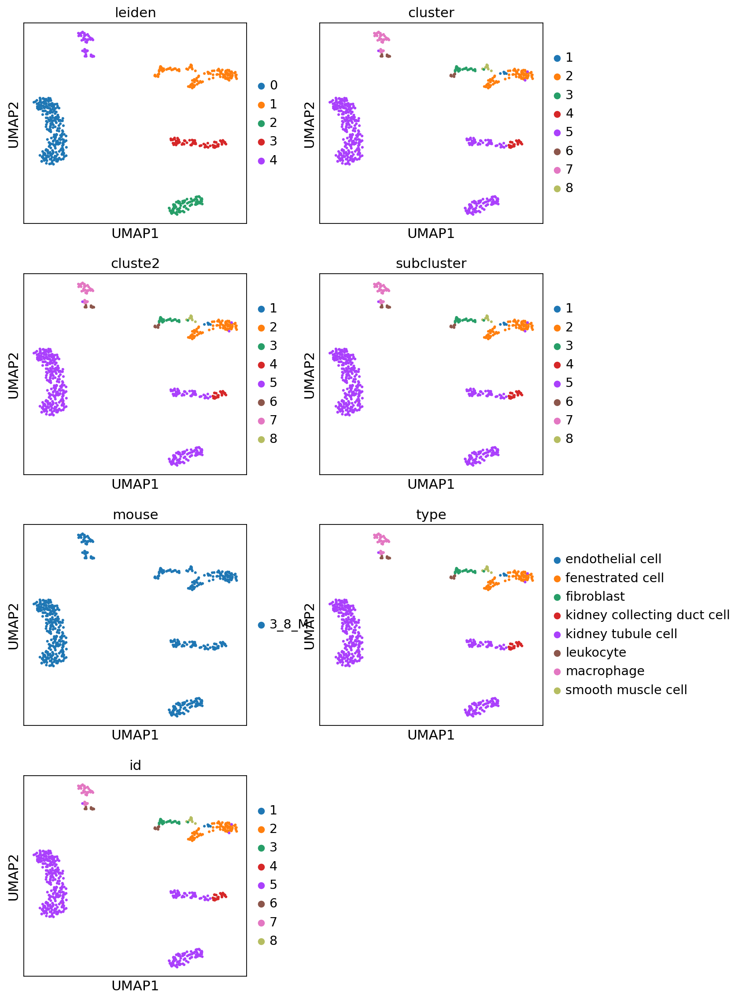

In [178]:
sc.pl.umap(adata,color=['leiden','cluster','cluste2','subcluster','mouse','type',
                       'id'],ncols=2,s=30)

In [179]:
sc.tl.rank_genes_groups(adata,groupby='leiden')

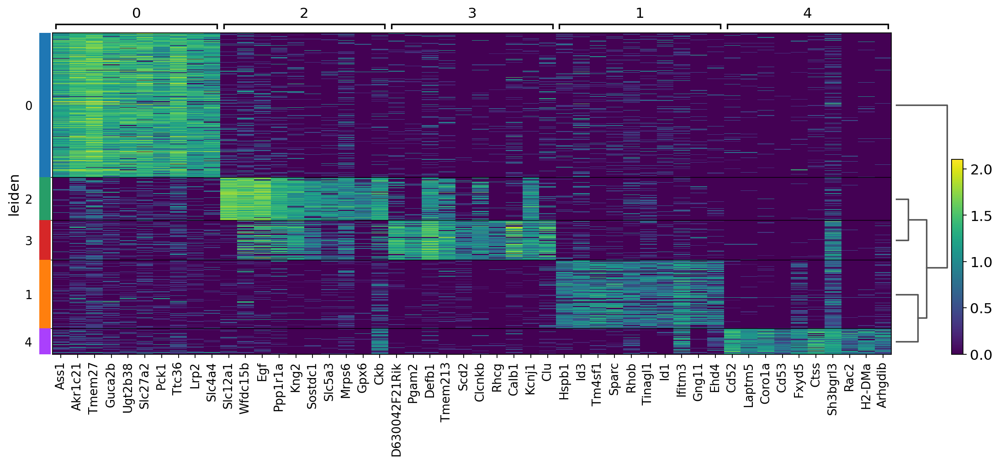

In [180]:
sc.pl.rank_genes_groups_heatmap(adata)

# hippocampus

In [205]:
slideseq_root = '/home/yzy/PUBDT/st/slideseq/all/hippocampus/'
cluster_file = 'cell_cluster_outcome.csv'

count_file = 'dge_hvgs.csv'

adata = sc.read_csv(slideseq_root+count_file)
adata_cluster = sc.read_csv(slideseq_root+cluster_file,dtype='str')


In [206]:
adata_cluster

AnnData object with n_obs × n_vars = 53621 × 1 

In [207]:
adata.obs['cluster'] = np.array(adata_cluster[:,0].X).astype('int')


adata.obs['cluster'] = adata.obs['cluster'].astype('category')


In [208]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
# sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=1000)
sc.pp.highly_variable_genes(adata, n_top_genes=3000)



sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata,resolution=0.1)

# sc.pl.embedding(adata,basis='spatial',color=['clusters'])


/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/envs/scaden/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))
/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 3 separate connected components using meta-embedding (experimental)
  n_components


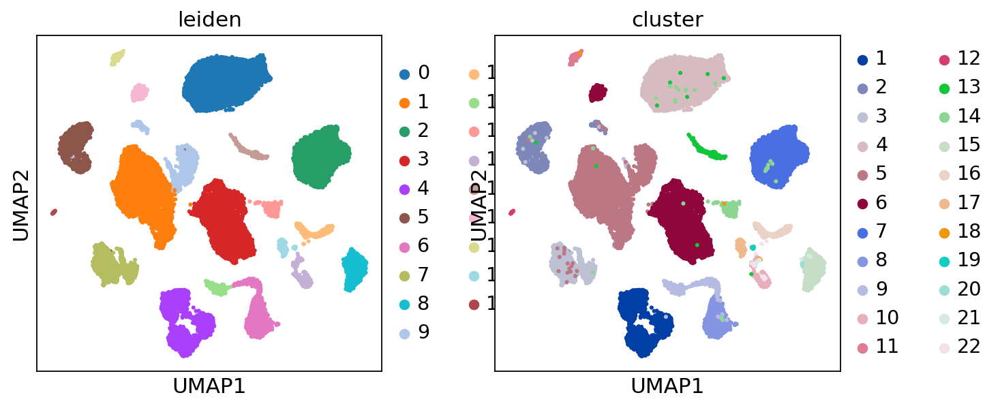

In [209]:
sc.pl.umap(adata,color=['leiden','cluster',
                       ],ncols=2,s=30)

# cerebellum

In [210]:
slideseq_root = '/home/yzy/PUBDT/st/slideseq/all/cerebellum/'
cluster_file = 'cell_cluster_outcome.csv'

count_file = 'dge_hvgs.csv'

adata = sc.read_csv(slideseq_root+count_file)
adata_cluster = sc.read_csv(slideseq_root+cluster_file,dtype='str')


In [212]:
adata.obs['cluster'] = np.array(adata_cluster[:,0].X).astype('int')


adata.obs['subcluster'] = np.array(adata_cluster[:,1].X).astype('str')



adata.obs['cluster'] = adata.obs['cluster'].astype('category')

adata.obs['subcluster'] = adata.obs['subcluster'].astype('category')


In [213]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
# sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=1000)
sc.pp.highly_variable_genes(adata, n_top_genes=3000)



sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata,resolution=0.1)

# sc.pl.embedding(adata,basis='spatial',color=['clusters'])


/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../anaconda3/envs/scaden/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


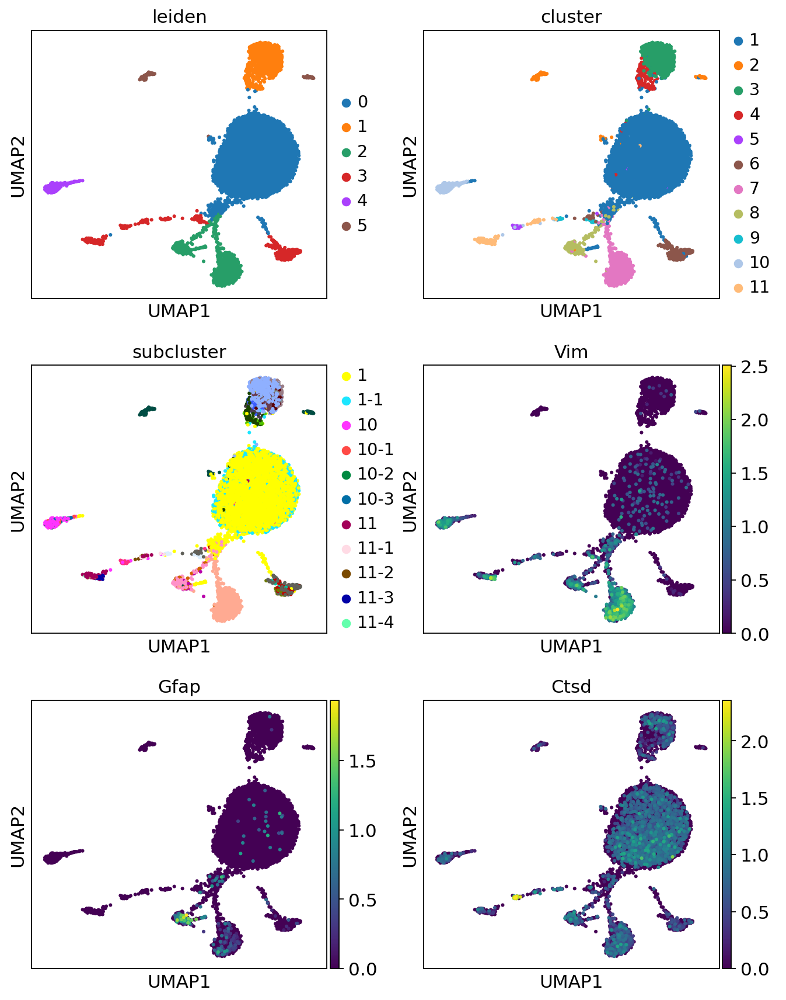

In [216]:
sc.pl.umap(adata,color=['leiden','cluster','subcluster'
                       ,'Vim','Gfap','Ctsd'],ncols=2,s=30)